# CS585 Problem Set 3 (Total points: 60 + 5 bonus)

Assignment adapted from Margrit Betke, Saraubh Gupta and Svetlana Lazebnik.

### Instructions

1.  Assignment is due at **11:59 PM on Tuesday April 1st 2025**.

2.  Submission instructions:

    1.  A single `.pdf` report that contains your work for Q1, Q2 and
        Q3. For Q1 you can either type out your responses in the notebook, or use
        any other word processing software.  You can also hand write them on a
        paper, or scan in hand-written answers. If you hand-write, please make
        sure they are neat and legible. If you are scanning, make sure that the
        scans are legible. Lastly, convert your work into a `PDF`. 

        For Q2 and Q3 your response should be electronic (no handwritten responses
        allowed). You should respond to each questions
        individually and include images as necessary. Your response to Q2 and Q3 in
        the PDF report should be self-contained. It should include all the
        output you want us to look at. You will not receive credit for any
        results you have obtained, but failed to include directly in the PDF
        report file. 

        PDF file should be submitted to
        [Gradescope](https://www.gradescope.com) under `PS3`. Please tag the reponses in your PDF with the Gradescope
        questions outline  as described in
        [Submitting an Assignment](https://youtu.be/u-pK4GzpId0). 

    2.  You also need to submit Pyhton code for Q2 and Q3 in the form of a single
        `.py` file that includes all your code, all in the same
        directory. You can convert this notebook to Python code by
        downloading the `.ipynb` file as Python(`.py`). Code should also be submitted to
        [Gradescope](https://www.gradescope.com) under `PS3-Code`. 
        *Not submitting your code will lead to a loss of
        100% of the points on Q3.* Autograder will use the cleaner script to remove unnecessary code. Please make sure your file has any unexpected code outside of the required function or class definitions. 

    3.  We reserve the right to take off points for not following
        submission instructions. In particular, please tag the reponses
        in your PDF with the Gradescope questions outline as described
        in [Submitting an Assignment](https://youtu.be/u-pK4GzpId0). 


1. **Optical Flow [10 pts, 3 parts]**

  **a) [2 pts]** Describe a scenario where the object is not moving but the optical flow field is not zero.

  The optical flow, defined as the apparent motion of “brightness patterns” in an image, represents the calculated, estimated movement of an object. In contrast, the “motion field” describes the actual motion of the object, which is the projection of the 3D scene’s motion into the image.

  A scenario where the object appears to be stationary but the optical flow field is not zero occurs when there are changes in the image, such as when the light or shadows shift. For instance, if the light is turned on or off, the surface brightness of the object changes, resulting in an optical flow based on these brightness changes, even though the actual motion of the object remains unchanged. 

  **b) [3 pts]** The Constant Brightness Assumption (CBA) is used in the Lucas and Kanade Algorithm. Describe how the algorithm to handles the fact that the assumption might be violated.

  The Lucas–Kanade algorithm assumes that the brightness between each frame is the same, but this isn’t always true in real life. Lighting changes, shadows, and reflections can all mess with the brightness. To fix this, the algorithm uses a technique called local averaging. It looks at small areas around each frame and averages the brightness there. This helps reduce the effect of small changes in brightness. The algorithm also focuses on tracking important features like corners, which have high intensity changes in both directions. These are more resistant to changes in brightness. The algorithm can also be built in a way that uses multiple scales to handle larger motions and smooth out intensity differences across different scales. This makes it more robust when the assumption of constant brightness isn’t exactly true.

  **c) [5 pts]** Why does the first order talor series provide a reasonable approximation for estimating optical flow?

  The Lucas–Kanade method, which forms the basis of the first-order Taylor series, assumes small inter-frame motions, known as “small motion.” This assumption leads to minimal pixel displacements and a smooth, differentiable image intensity function. Consequently, the higher-order terms in the Taylor expansion become negligible, effectively capturing most of the variation. Moreover, the linearized brightness constancy constraint simplifies the estimation into a solvable linear system, while still yielding accurate flow vectors in regions with small and continuous motion.



 2. **Contour Detection [20 pts]**. In this problem we will build a basic contour detector. 

  We have implemented a contour detector that uses the magnitude of the local image gradient as the boundary score as seen below:

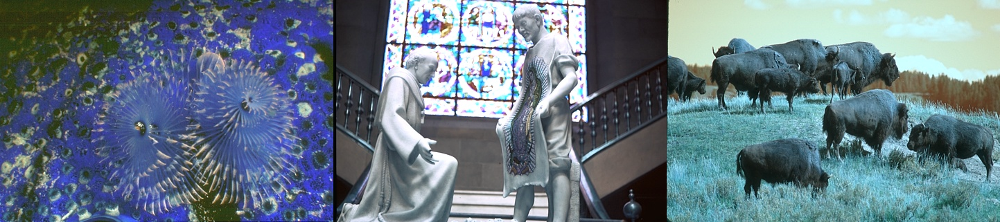

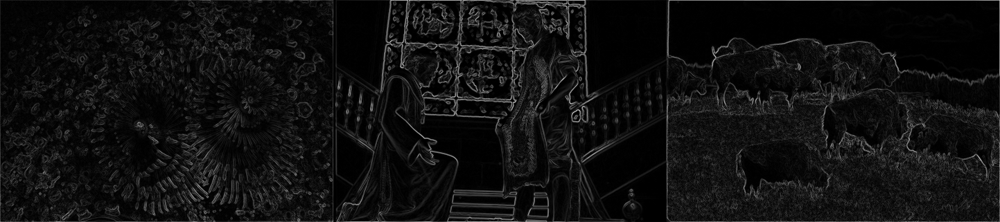

Overall F1 score: 0.4163603293750655


In [2]:
from PIL import Image
import numpy as np
import cv2, os
from scipy.io import loadmat
from scipy import signal
import matplotlib.pyplot as plt
import skimage
import evaluate_boundaries


N_THRESHOLDS = 99

def detect_edges(imlist, fn):
  """
  Detects edges in every image in the image list.
  
  :param imlist: a list of filenames.
  :param fn: an edge detection function.
  
  return: (list of image arrays, list of edge arrays). Edge array is of the same size as the image array.
  """  
  images, edges = [], []
  for imname in imlist:
    I = cv2.imread(os.path.join('data', str(imname)+'.jpg'))
    images.append(I)

    I = cv2.cvtColor(I, cv2.COLOR_BGR2GRAY)
    I = I.astype(np.float32)/255.
    mag = fn(I)
    edges.append(mag)
  return images, edges

def evaluate(imlist, all_predictions):
  """
  Compares the predicted edges with the ground truth.
  
  :param imlist: a list of images.
  :param all_predictions: predicted edges for imlist.
  
  return: the evaluated F1 score.
  """  
  count_r_overall = np.zeros((N_THRESHOLDS,))
  sum_r_overall = np.zeros((N_THRESHOLDS,))
  count_p_overall = np.zeros((N_THRESHOLDS,))
  sum_p_overall = np.zeros((N_THRESHOLDS,))
  for imname, predictions in zip(imlist, all_predictions):
    gt = loadmat(os.path.join('data', str(imname)+'.mat'))['groundTruth']
    num_gts = gt.shape[1]
    gt = [gt[0,i]['Boundaries'][0,0] for i in range(num_gts)]
    count_r, sum_r, count_p, sum_p, used_thresholds = \
              evaluate_boundaries.evaluate_boundaries_fast(predictions, gt, 
                                                           thresholds=N_THRESHOLDS,
                                                           apply_thinning=True)
    count_r_overall += count_r
    sum_r_overall += sum_r
    count_p_overall += count_p
    sum_p_overall += sum_p

  rec_overall, prec_overall, f1_overall = evaluate_boundaries.compute_rec_prec_f1(
        count_r_overall, sum_r_overall, count_p_overall, sum_p_overall)
  
  return max(f1_overall)

def compute_edges_dxdy(I):
  """
  Returns the norm of dx and dy as the edge response function.
  
  :param I: image array
  
  return: edge array
  """
  
  dx = signal.convolve2d(I, np.array([[-1, 0, 1]]), mode='same')
  dy = signal.convolve2d(I, np.array([[-1, 0, 1]]).T, mode='same')
  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)
  return mag

def normalize(mag):
  """
  Normalizes the edge array to [0,255] for display.
  
  :param mag: unnormalized edge array.
  
  return: normalized edge array
  """  
  mag = mag / 1.5
  mag = mag * 255.
  mag = np.clip(mag, 0, 255)
  mag = mag.astype(np.uint8)
  return mag


imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

  **a) Warm-up [5 pts] .** As you visualize the produced edges, you will notice artifacts at image boundaries. Modify how the convolution is being done to minimize these artifacts.

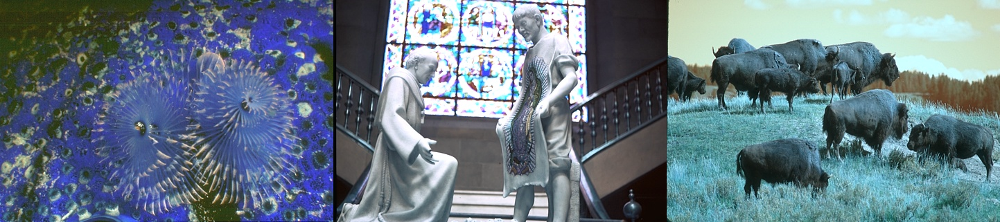

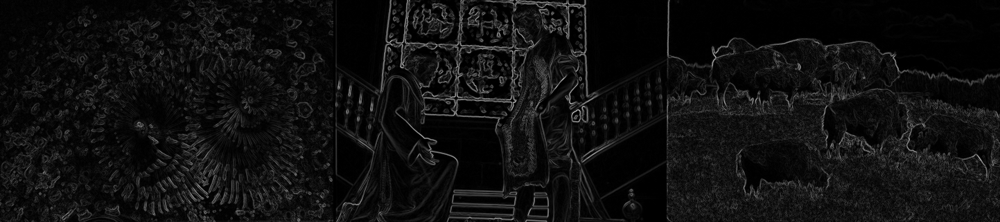

Overall F1 score: 0.4175307435125027


In [2]:
def compute_edges_dxdy_warmup(I):
  """
  Returns the norm of dx and dy as the edge response function.
  
  :param I: image array
  
  return: edge array, which is a HxW numpy array
  """

  """Hint: Look at arguments for scipy.signal.convolve2d"""
  # ADD YOUR CODE HERE
  dx=None
  dy=None
    
  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)
  return mag


imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_warmup
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

 **b) Smoothing [5 pts] .** Next, notice that we are using [−1, 0, 1] filters for computing the gradients, and they are susceptible to noise. Use derivative of Gaussian filters to obtain more robust estimates of the gradient. Experiment with different sigma for this Gaussian filtering and pick the one that works the best.

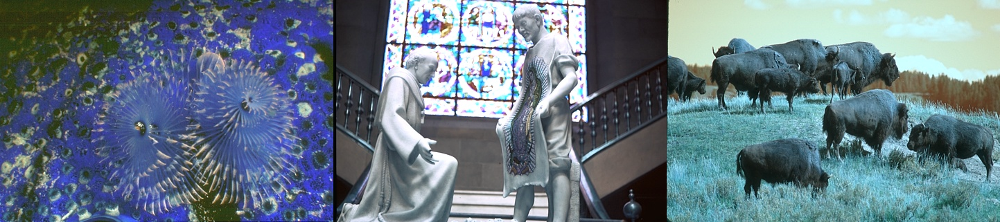

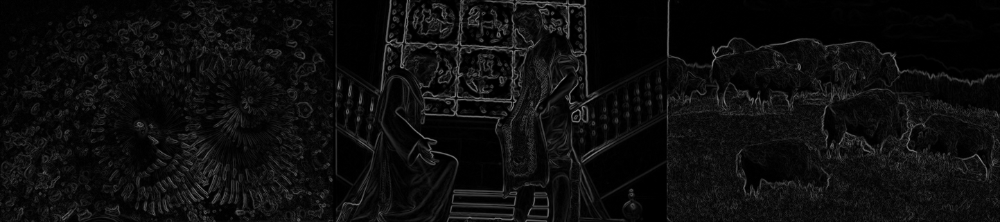

Overall F1 score: 0.41960372210480334


In [3]:
def compute_edges_dxdy_smoothing(I):
  """
  Returns the norm of dx and dy as the edge response function.
  
  :param I: image array
  
  return: edge array, which is a HxW numpy array
  """

  """ Copy over your response from part a and alter it to include this answer. See cv2.GaussianBlur"""
  # ADD YOUR CODE HERE
  dx=None
  dy=None

  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)
  return mag


imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_smoothing
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

**c) Non-maximum Suppression [10 pts] .** The current code does not produce thin edges. Implement non-maximum suppression, where we look at the gradient magnitude at the two neighbours in the direction perpendicular to the edge. We suppress the output at the current pixel if the output at the current pixel is not more than at the neighbors. You will have to compute the orientation of the contour (using the X and Y gradients), and then lookup values at the neighbouring pixels.

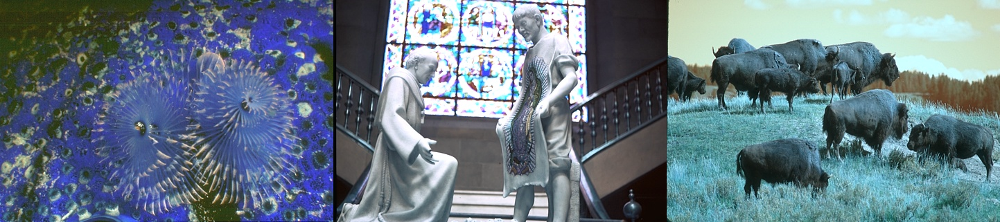

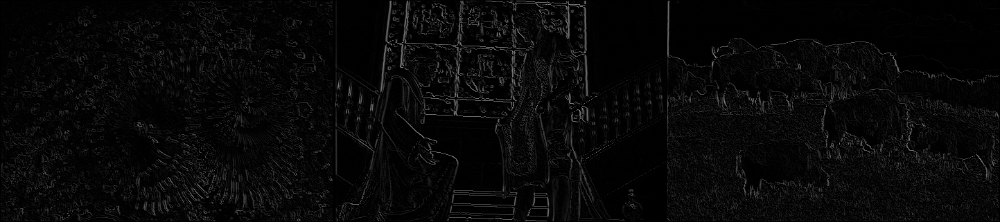

Overall F1 score: 0.44267100609263477


In [4]:
def compute_edges_dxdy_nonmax(I):
  """
  Returns the norm of dx and dy as the edge response function after non-maximum suppression.
  
  :param I: image array
  
  return: edge array, which is a HxW numpy array
  """

  """ Copy over your response from part b and alter it to include this response"""
  # ADD YOUR CODE in part b
 

  mag = np.sqrt(dx**2 + dy**2)
  mag = normalize(mag)

  # ADD YOUR CODE HERE
  non_max_mag=None

  return non_max_mag


imlist = [12084, 24077, 38092]
fn = compute_edges_dxdy_nonmax
images, edges = detect_edges(imlist, fn)
display(Image.fromarray(np.hstack(images)))
display(Image.fromarray(np.hstack(edges)))
f1 = evaluate(imlist, edges)
print('Overall F1 score:', f1)

 3. **Stitching pairs of images [30 pts]**. In this problem we will estimate homography transforms to register and stitch image pairs. We are providing a image pairs that you should stitch together. We have also provided sample output, though, keep in mind that your output may look different from the reference output depending on implementation details.
 
   **Getting Started** We have implemented some helper functions to detect feature points in both images and extract descriptor of every keypoint in both images. We used SIFT descriptors from OpenCV library. You can refer to this [tutorial](https://docs.opencv.org/4.5.1/da/df5/tutorial_py_sift_intro.html) for more details about using SIFT in OpenCV. Please use opencv version 4.5 or later.

In [5]:
# some helper functions

def imread(fname):
    """
    Read image into np array from file.
    
    :param fname: filename.
    
    return: image array.
    """
    return cv2.imread(fname)

def imread_bw(fname):
    """
    Read image as gray scale format.
    
    :param fname: filename.
    
    return: image array.
    """
    return cv2.cvtColor(imread(fname), cv2.COLOR_BGR2GRAY)

def imshow(img):
    """
    Show image.
    
    :param img: image array.
    """
    skimage.io.imshow(img)
    
def get_sift_data(img):
    """
    Detect the keypoints and compute their SIFT descriptors with opencv library
    
    :param img: image array.
    
    return: (keypoints array, descriptors). keypoints array (Nx2) contains the coordinate (x,y) of each keypoint. 
    Descriptors have size Nx128.
    """
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(img, None)
    kp = np.array([k.pt for k in kp])
    return kp, des

def plot_inlier_matches(ax, img1, img2, inliers):
    """
    Plot the match between two image according to the matched keypoints
    
    :param ax: plot handle
    :param img1: left image
    :param img2: right image
    :param inliers: x,y in the first image and x,y in the second image (Nx4)
    """
    res = np.hstack([img1, img2])
    ax.set_aspect('equal')
    ax.imshow(res, cmap='gray')
    
    ax.plot(inliers[:,2], inliers[:,3], '+r')
    ax.plot(inliers[:,0] + img1.shape[1], inliers[:,1], '+r')
    ax.plot([inliers[:,2], inliers[:,0] + img1.shape[1]],
            [inliers[:,3], inliers[:,1]], 'r', linewidth=0.4)
    ax.axis('off')

**a) Putative Matches [5 pts].** Select putative matches based on the matrix of pairwise descriptor distances.  First, Compute distances between every descriptor in one image and every descriptor in the other image. We will use `scipy.spatial.distance.cdist(X, Y, 'sqeuclidean')`. Then, you can select all pairs  whose descriptor distances are below a specified threshold, or select the top few hundred descriptor pairs with the smallest pairwise distances. In your report, display the putative matches overlaid on the image pairs.

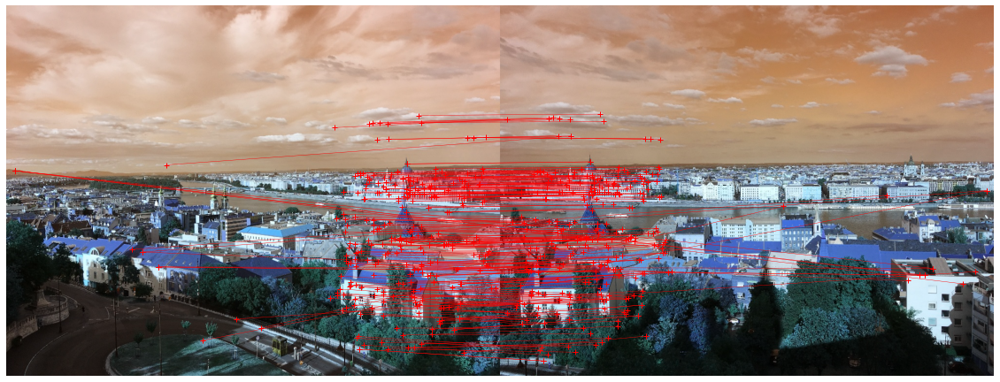

In [6]:
import scipy

def get_best_matches(img1, img2, num_matches):
    """
    Returns the matched keypoints between img1 and img2.
    :param img1: leftimage.
    :param img2: right image.
    :param num_matches: the number of matches that we want.
    
    return: pixel coordinates of the matched keypoints (x,y in the first image and x,y in the second image), which is a Nx4 numpy array. 
    """
    kp1, des1 = get_sift_data(img1)
    kp2, des2 = get_sift_data(img2)

    # Find distance between descriptors in images
    dist = scipy.spatial.distance.cdist(des1, des2, 'sqeuclidean')
    
    # Write your code to get the matches according to dist
    # ADD YOUR CODE HERE
    out_kp=None
    
    return out_kp


img1 = imread('./data/left.jpg')
img2 = imread('./data/right.jpg')

data = get_best_matches(img1, img2, 300)
fig, ax = plt.subplots(figsize=(20,10))
plot_inlier_matches(ax, img1, img2, data)
#fig.savefig('sift_match.pdf', bbox_inches='tight')

**b) Homography Estimation and RANSAC [20 pts].** Implement RANSAC to estimate a homography mapping one image onto the other. Describe the various implementation details, and report all the hyperparameters, the number of inliers, and the average residual for the inliers (mean squared distance between the point coordinates in one image and the transformed coordinates of the matching point in the other image). Also, display the locations of inlier matches in both images.
        
  **Hints:** For RANSAC, a very simple implementation is sufficient. Use four matches to initialize the homography in each iteration. You should output a single transformation that gets the most inliers in the course of all the iterations. For the various RANSAC parameters (number of iterations, inlier threshold), play around with a few reasonable values and pick the ones that work best. Homography fitting calls for homogeneous least squares. The solution to the homogeneous least squares system $AX = 0$ is obtained from the SVD of $A$ by the singular vector corresponding to the smallest singular value. In Python, `U, S, V = numpy.linalg.svd(A)` performs the singular value decomposition (SVD). This function decomposes A into $U, S, V$ such that $A = USV$ (and not $USV^T$) and `V[−1,:]` gives the right singular vector corresponding to the smallest singular value. *Your implementation should not use any opencv functions.*

In [7]:

def ransac(data, max_iters=10000, min_inliers=10):
    """
    Write your ransac code to find the best model, inliers, and residuals
    
    :param data: pixel coordinates of matched keypoints.
    :param max_iters: number of maximum iterations
    :param min_inliers: number of minimum inliers in RANSAC
    
    return: (homography matrix, number of inliers) -> (3x3 numpy array, int)
    """
    # ADD YOUR CODE HERE
    H_out,best_perf=None,None

    return H_out, best_perf

def compute_homography(matches):
    """
    Write your code to compute homography according to the matches
    
    :param matches: coordinates of matched  keypoints.
    
    return: homography matrix, which is a 3x3 numpy array
    """
    # ADD YOUR CODE HERE
    H=None
    return H

np.random.seed(1237)
# Report the number of inliers in your matching
H, max_inliers = ransac(data)
print("Inliers:", max_inliers)

Inliers: 277


**c) Image Warping [5 pts].** Warp one image onto the other using the estimated transformation. You can use opencv functions for this purpose.

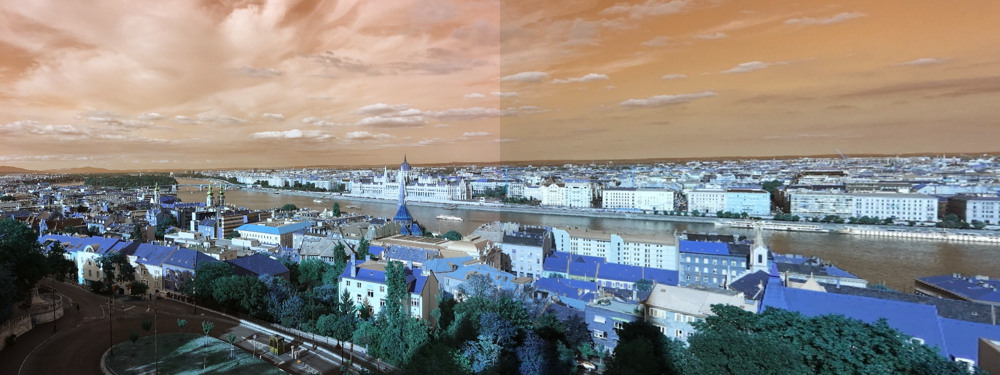

In [8]:
def warp_images(img1, img2, H):
    """
    Write your code to stitch images together according to the homography
    
    :param img1: left image
    :param img2: right image
    :param H: homography matrix
    
    return: stitched image, should be a HxWx3 array.
    """
    # ADD YOUR CODE HERE
    img_warped=None
    
    return img_warped

# display the stitching results
img_warped = warp_images(img1, img2, H)
display(Image.fromarray(img_warped))

**d) Image Warping Bonus [5 bonus pts].** Warp one image onto the other using the estimated transformation *without opencv functions*. Create a new image big enough to hold the panorama and composite the two images into it. You can composite by averaging the pixel values where the two images overlap, or by using the pixel values from one of the images. Your result should look similar to the sample output. You should create **color panoramas** by applying  the same compositing step to each of the color channels separately (for estimating the transformation, it is sufficient to use grayscale images). You may find `ProjectiveTransform` and warp functions in `skimage.transform` useful.

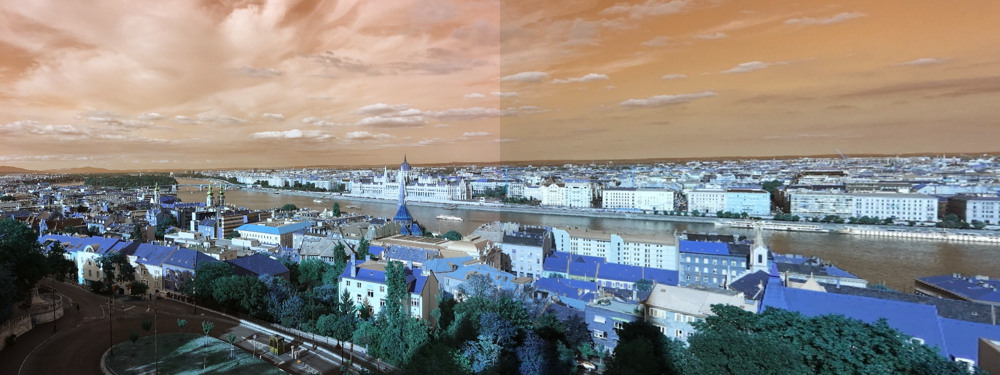

In [9]:
import skimage.transform


def warp_images_noopencv(img1, img2, H):
    """
    Write your code to stitch images together according to the homography
    
    :param img1: left image
    :param img2: right image
    :param H: homography matrix
    
    return: stitched image, should be a HxWx3 array.
    """
    # ADD YOUR CODE HERE
    img_warped=None
    
    return img_warped

# display and report the stitching results
img_warped_nocv = warp_images_noopencv(img1, img2, H)
display(Image.fromarray(img_warped))